# Speech Enhancement: LMS, Spectral Subtraction, Wiener Filter + SNR Evaluation
This notebook includes:
- Adaptive Filtering (LMS)
- Spectral Subtraction
- Wiener Filtering
- SNR Calculation

Load your own audio files named 'clean.wav' and 'noise.wav'.

In [58]:
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import librosa
import librosa.display
import scipy.signal
import os

In [59]:
# SNR Calculation
def calculate_snr(clean_signal, enhanced_signal):
    min_len = min(len(clean_signal), len(enhanced_signal))
    clean_signal = clean_signal[:min_len]
    enhanced_signal = enhanced_signal[:min_len]
    noise = clean_signal - enhanced_signal
    signal_power = np.mean(clean_signal ** 2)
    noise_power = np.mean(noise ** 2)
    snr = 10 * np.log10(signal_power / (noise_power + 1e-10))
    return snr

In [60]:
# LMS Adaptive Filter
def lms_filter(noisy, desired, mu=0.01, filter_len=32):
    n = len(noisy)
    w = np.zeros(filter_len)
    output = np.zeros(n)
    for i in range(filter_len, n):
        x = noisy[i-filter_len:i][::-1]
        y = np.dot(w, x)
        e = desired[i] - y
        w += 2 * mu * e * x
        output[i] = y
    return output

In [61]:
# Spectral Subtraction
def spectral_subtraction(noisy, sr, noise_len=1):
    noise_sample = noisy[:sr * noise_len]
    noisy_stft = librosa.stft(noisy)
    noise_stft = librosa.stft(noise_sample)
    noise_mag = np.abs(noise_stft).mean(axis=1, keepdims=True)
    noisy_mag = np.abs(noisy_stft)
    phase = np.angle(noisy_stft)
    enhanced_mag = np.maximum(noisy_mag - noise_mag, 0)
    enhanced_stft = enhanced_mag * np.exp(1j * phase)
    enhanced = librosa.istft(enhanced_stft)
    return enhanced

In [62]:
# Wiener Filter
def wiener_filter(noisy, sr):
    f, t, Zxx = scipy.signal.stft(noisy, fs=sr)
    power_spec = np.abs(Zxx) ** 2
    noise_est = np.mean(power_spec[:, :10], axis=1, keepdims=True)
    H = power_spec / (power_spec + noise_est)
    enhanced_Zxx = H * Zxx
    _, enhanced = scipy.signal.istft(enhanced_Zxx, fs=sr)
    return enhanced

In [75]:
# Load signals
clean, sr = sf.read('harvard.wav')
noise, _ = sf.read('sample-1.wav')
if len(noise) < len(clean):
    noise = np.tile(noise, int(np.ceil(len(clean) / len(noise))))[:len(clean)]
if clean.ndim == 2 and noise.ndim == 1:
    noise = np.column_stack([noise, noise])
noisy = clean + noise
sf.write('noisy.wav', noisy, sr)

In [76]:
# Apply LMS for each channel
enhanced_lms = np.zeros_like(clean)
for ch in range(clean.shape[1]):
	enhanced_lms[:, ch] = lms_filter(noisy[:, ch], clean[:, ch])
sf.write('enhanced_lms.wav', enhanced_lms, sr)
print('LMS SNR:', calculate_snr(clean, enhanced_lms))

LMS SNR: 13.410213475099479


In [77]:
# Apply Spectral Subtraction for each channel
enhanced_spec = np.zeros_like(clean)
for ch in range(clean.shape[1]):
	enhanced_ch = spectral_subtraction(noisy[:, ch], sr)
	min_len = min(len(enhanced_ch), enhanced_spec.shape[0])
	enhanced_spec[:min_len, ch] = enhanced_ch[:min_len]
sf.write('enhanced_spectral.wav', enhanced_spec, sr)
print('Spectral Subtraction SNR:', calculate_snr(clean, enhanced_spec))

Spectral Subtraction SNR: 17.66820087324083


In [78]:
# Apply Wiener Filter for each channel
enhanced_wiener = np.zeros_like(clean)
for ch in range(clean.shape[1]):
    enhanced_ch = wiener_filter(noisy[:, ch], sr)
    min_len = min(len(enhanced_ch), enhanced_wiener.shape[0])
    enhanced_wiener[:min_len, ch] = enhanced_ch[:min_len]
sf.write('enhanced_wiener.wav', enhanced_wiener, sr)
print('Wiener Filter SNR:', calculate_snr(clean, enhanced_wiener))

Wiener Filter SNR: 15.919360783363473


### Spectrogram Plotting Function

In [79]:
# Provide a metric for the comparison of snr values of Adaptive lms and Spectral Subtraction
snr_lms = calculate_snr(clean, enhanced_lms)
snr_spec = calculate_snr(clean, enhanced_spec)
print(f'SNR of LMS: {snr_lms:.2f} dB')
print(f'SNR of Spectral Subtraction: {snr_spec:.2f} dB')
print('Wiener Filter SNR:', calculate_snr(clean, enhanced_wiener))



SNR of LMS: 13.41 dB
SNR of Spectral Subtraction: 17.67 dB
Wiener Filter SNR: 15.919360783363473


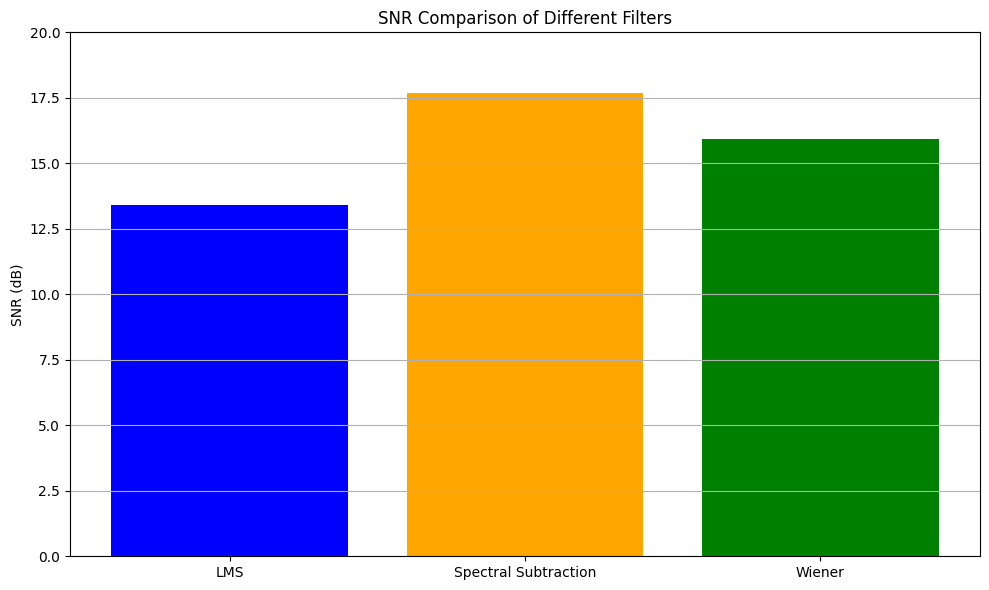

In [80]:
# Plot the snr values of each filter for comaprison 
plt.figure(figsize=(10, 6))
plt.bar(['LMS', 'Spectral Subtraction', 'Wiener'], [snr_lms, snr_spec, calculate_snr(clean, enhanced_wiener)], color=['blue', 'orange', 'green'])
plt.ylabel('SNR (dB)')
plt.title('SNR Comparison of Different Filters')
plt.ylim(0, 20)
plt.grid(axis='y')
plt.tight_layout()


### Audio Playback GUI

In [81]:
from IPython.display import Audio, display

def play_audio(path):
    display(Audio(path))

### Compare All Methods with Spectrograms

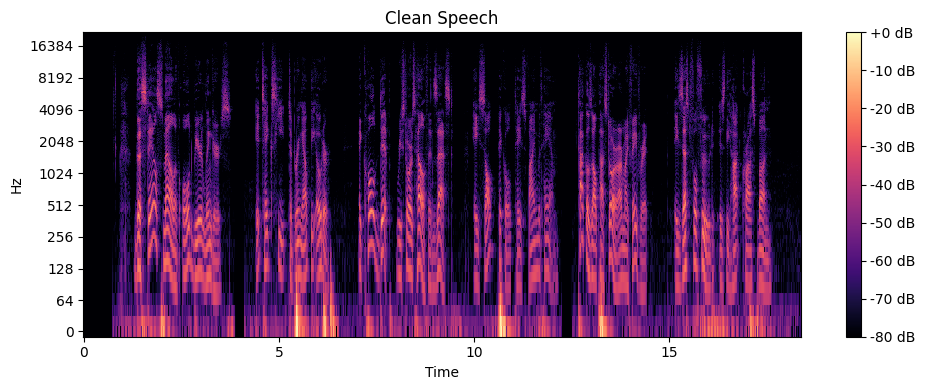

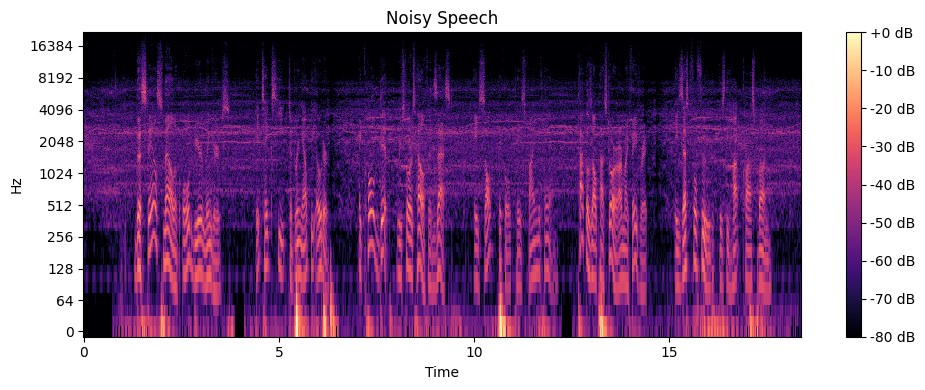

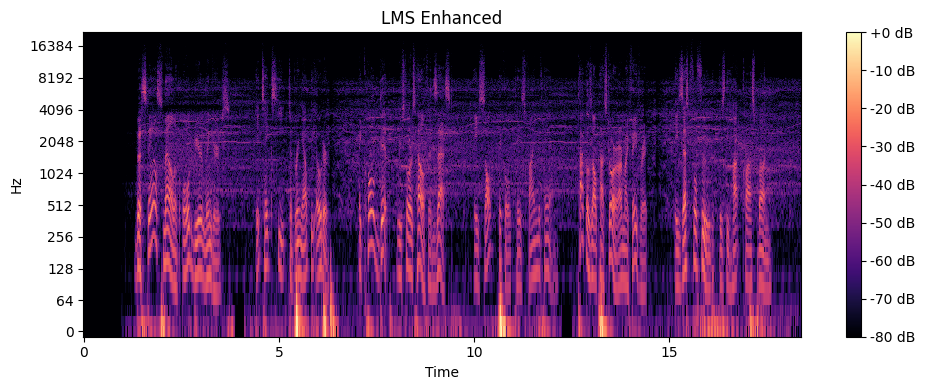

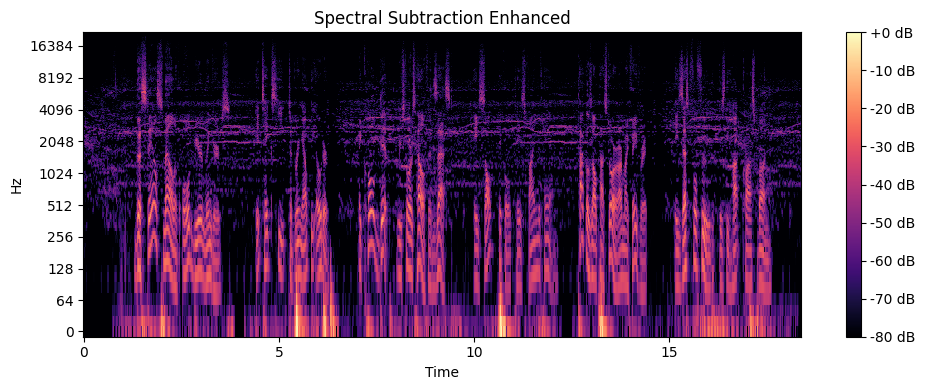

In [82]:
# Plot only the first channel for each signal to avoid MemoryError
plot_spectrogram(clean[:, 0], sr, 'Clean Speech')
plot_spectrogram(noisy[:, 0], sr, 'Noisy Speech')
plot_spectrogram(enhanced_lms[:, 0], sr, 'LMS Enhanced')
plot_spectrogram(enhanced_spec[:, 0], sr, 'Spectral Subtraction Enhanced')

### Listen to Audio Outputs

In [ ]:
print("Clean Speech:")
display(Audio(clean[:, 0], rate=sr))
print("Noisy Speech:")
display(Audio(noisy[:, 0], rate=sr))
print("LMS Enhanced:")
display(Audio(enhanced_lms[:, 0], rate=sr))
print("Spectral Subtraction Enhanced:")
display(Audio(enhanced_spec[:, 0], rate=sr))

Clean Speech:


Noisy Speech:


LMS Enhanced:


Spectral Subtraction Enhanced:


Wiener Filter Enhanced:
